In [1]:
# Import libraries
import os
import sys
import requests

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, RocCurveDisplay, ConfusionMatrixDisplay

In [2]:
# Import data
price_data = pd.read_csv(r'D:\01 FinTech\Big Data Analytics\Final\SPY.csv')
price_data.head(30)

,Date,Open,High,Low,Close,Adj Close,Volume
0,29-01-1993,43.96875,43.96875,43.75000,43.93750,24.941387,1003200
1,01-02-1993,43.96875,44.25000,43.96875,44.25000,25.118774,480500
2,02-02-1993,44.21875,44.37500,44.12500,44.34375,25.172007,201300
3,03-02-1993,44.40625,44.84375,44.37500,44.81250,25.438095,529400
4,04-02-1993,44.96875,45.09375,44.46875,45.00000,25.544523,531500
5,05-02-1993,44.96875,45.06250,44.71875,44.96875,25.526791,492100
6,08-02-1993,44.96875,45.12500,44.90625,44.96875,25.526791,596100
7,09-02-1993,44.81250,44.81250,44.56250,44.65625,25.349400,122100
8,10-02-1993,44.65625,44.75000,44.53125,44.71875,25.384880,379600
9,11-02-1993,44.78125,45.12500,44.78125,44.93750,25.509043,19500


In [3]:
# Period
period = 14

# Calculate daily price changes
delta = price_data['Close'].diff(1)

# Calculate gains (positive changes) and losses (negative changes)
gains = delta.where(delta > 0, 0)
losses = -delta.where(delta < 0, 0)

# Calculate average gains and losses over the specified period
avg_gains = gains.rolling(window=period, min_periods=1).mean()
avg_losses = losses.rolling(window=period, min_periods=1).mean()

# Calculate RSI
price_data['RSI']  = 100 - (100 / (1 + (avg_gains / avg_losses)))


In [4]:
# Stochastic Oscillator
period = 14
k_smooth = 3

# Calculate %K
price_data['%K'] = ((price_data['Close'] - price_data['Low'].rolling(window=period).min()) /
                                      (price_data['High'].rolling(window=period).max() - price_data['Low'].rolling(window=period).min())) * 100

# Smooth %K to get %D
price_data['%D'] = price_data['%K'].rolling(window=k_smooth).mean()


In [5]:
# Calculate Williams %R
price_data['Williams %R'] = -100 * ((price_data['High'].rolling(window=period).max() - price_data['Close']) /
                                    (price_data['High'].rolling(window=period).max() - price_data['Low'].rolling(window=period).min()))

In [6]:
# Parameters
short_window = 12  # Short-term EMA window
long_window = 26   # Long-term EMA window
signal_window = 9  # Signal line EMA window

# Calculate short-term and long-term EMAs
short_ema = price_data['Close'].ewm(span=short_window, adjust=False).mean()
long_ema = price_data['Close'].ewm(span=long_window, adjust=False).mean()

# Calculate MACD line
price_data['MACD'] = short_ema - long_ema


In [7]:
# Calculate the Price Rate of Change
roc_period = 14  # Time period for ROC calculation

# Calculate Price Rate of Change (ROC)
price_data['ROC'] = price_data['Close'].pct_change(roc_period) * 100


In [8]:
#OBV
Daily_Return = price_data['Close'].pct_change()
Direction = Daily_Return.apply(lambda x: 1 if x >= 0 else -1)
price_data['OBV'] = Direction * price_data['Volume']
price_data['OBV'] = price_data['OBV'].cumsum()


In [9]:
# Define the window sizes
window_sizes = [9, 20, 50, 100, 200]

# Calculate SMAs and add them to the DataFrame
for window_size in window_sizes:
    column_name = f'SMA_{window_size}'
    price_data[column_name] = price_data['Close'].rolling(window=window_size).mean()\
     

In [11]:
# Define the conversion line (Tenkan-sen) and base line (Kijun-sen) periods
tenkan_sen_period = 9
kijun_sen_period = 26

# Calculate Tenkan-sen and Kijun-sen
price_data['Ichimoku_Conversion_Line'] = price_data['Close'].rolling(window=tenkan_sen_period).mean()
price_data['Ichimoku_Base_Line'] = price_data['Close'].rolling(window=kijun_sen_period).mean()

# Define the leading span periods
senkou_span_a_period = 9
senkou_span_b_period = 26

# Calculate Leading Span A and Leading Span B
price_data['Leading Span A'] = price_data[['Ichimoku_Conversion_Line', 'Ichimoku_Base_Line']].mean(axis=1).shift(senkou_span_a_period)
price_data['Leading Span B'] = price_data['Close'].rolling(window=senkou_span_b_period).mean().shift(senkou_span_b_period)



In [12]:
# Define the window size for the moving average and standard deviation
window_size = 20

# Calculate the rolling standard deviation
Rolling_SD = price_data['Close'].rolling(window=window_size).std()

# Calculate the upper and lower Bollinger Bands
price_data['Upper Band'] = price_data['SMA_20'] + (2 * Rolling_SD)
price_data['Lower Band'] = price_data['SMA_20'] - (2 * Rolling_SD)

# display the data frame.
price_data.tail(20)

,Date,Open,High,Low,Close,Adj Close,Volume,RSI,%K,%D,...,SMA_20,SMA_50,SMA_100,SMA_200,Ichimoku_Conversion_Line,Ichimoku_Base_Line,Leading Span A,Leading Span B,Upper Band,Lower Band
7752,10-11-2023,435.980011,440.929993,433.829987,440.609985,440.609985,89462200,69.056160,98.991148,93.419638,...,427.048997,432.710800,439.128201,424.668251,432.292223,428.416538,423.105381,438.387309,445.612877,408.485118
7753,13-11-2023,439.230011,441.329987,438.420013,440.190002,440.190002,52236100,66.520350,96.450856,93.206114,...,427.256497,432.490800,439.165001,424.840801,434.735555,428.826153,422.168353,437.561540,446.329323,408.183671
7754,14-11-2023,446.320007,450.059998,446.089996,448.730011,448.730011,97176900,79.650086,96.744218,97.395407,...,427.891998,432.480601,439.320201,425.081501,437.632222,429.458461,421.896986,436.866925,448.939094,406.844903
7755,15-11-2023,450.109985,451.380005,448.799988,449.679993,449.679993,77327600,88.254717,95.968671,96.387915,...,428.865498,432.549800,439.502601,425.297501,439.734443,430.040768,422.519230,436.226540,452.055994,405.675003
7756,16-11-2023,449.220001,450.559998,448.119995,450.230011,450.230011,66665800,91.887338,97.063346,96.592078,...,430.055499,432.657401,439.643201,425.494651,441.461110,430.575768,423.428440,435.729618,455.089095,405.021903
7757,17-11-2023,450.239990,451.420013,449.290009,450.790009,450.790009,83133200,91.063957,98.306897,97.112971,...,431.535500,432.762801,439.787201,425.664701,443.138889,431.234614,424.256325,435.246541,457.830383,405.240616
7758,20-11-2023,450.529999,455.130005,450.519989,454.260010,454.260010,69936200,91.239731,97.615146,97.661796,...,433.225501,432.879001,439.948701,425.874251,445.064446,432.109999,425.517992,434.733079,460.835047,405.615954
7759,21-11-2023,453.179993,454.130005,451.959991,453.269989,453.269989,49244600,88.024825,93.489620,96.470554,...,434.707500,433.024601,440.048601,426.091451,446.844445,432.772691,427.191368,434.368465,463.312413,406.102586
7760,22-11-2023,454.980011,456.380005,453.890015,455.019989,455.019989,59394900,85.781685,94.180504,95.095090,...,436.581000,433.194800,440.160901,426.290601,449.197778,433.503460,428.654574,433.890387,465.362069,407.799931
7761,24-11-2023,455.070007,455.500000,454.730011,455.299988,455.299988,29737400,84.066090,95.300189,94.323438,...,438.718500,433.293601,440.282601,426.513851,450.830000,434.468460,430.354380,433.283464,466.310241,411.126758


In [13]:
# Create a column we wish to predict
'''
    In this case, we will generate an output column that will be 1 if the closing price at time 't' is greater than 't-1' and 0 otherwise.
    In other words, if the today's closing price is greater than yesterday's closing price it would be 1.
'''

# Group by the `Symbol` column, then grab the `Close` column.
close_groups = price_data['Close']

# Apply the lambda function which will return -1.0 for down, 1.0 for up and 0.0 for no change.
close_groups = close_groups.transform(lambda x : np.sign(x.diff()))

# add the data to the main dataframe.
price_data['Direction'] = close_groups

# for simplicity in later sections I'm going to make a change to our prediction column. To keep this as a binary classifier I'll change flat days and consider them up days.
price_data.loc[price_data['Direction'] == 0.0] = 1.0


# print the head
price_data.head(20)

,Date,Open,High,Low,Close,Adj Close,Volume,RSI,%K,%D,...,SMA_50,SMA_100,SMA_200,Ichimoku_Conversion_Line,Ichimoku_Base_Line,Leading Span A,Leading Span B,Upper Band,Lower Band,Direction
0,29-01-1993,43.96875,43.96875,43.75000,43.93750,24.941387,1003200,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01-02-1993,43.96875,44.25000,43.96875,44.25000,25.118774,480500,100.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2,02-02-1993,44.21875,44.37500,44.12500,44.34375,25.172007,201300,100.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
3,03-02-1993,44.40625,44.84375,44.37500,44.81250,25.438095,529400,100.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
4,04-02-1993,44.96875,45.09375,44.46875,45.00000,25.544523,531500,100.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
5,05-02-1993,44.96875,45.06250,44.71875,44.96875,25.526791,492100,97.142857,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0
6,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.0,1.000000,1.0,1.000000,1.000000,1.0
7,09-02-1993,44.81250,44.81250,44.56250,44.65625,25.349400,122100,75.555556,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0
8,10-02-1993,44.65625,44.75000,44.53125,44.71875,25.384880,379600,76.595745,NaN,NaN,...,NaN,NaN,NaN,44.628472,NaN,NaN,NaN,NaN,NaN,1.0
9,11-02-1993,44.78125,45.12500,44.78125,44.93750,25.509043,19500,79.629630,NaN,NaN,...,NaN,NaN,NaN,44.739583,NaN,NaN,NaN,NaN,NaN,1.0


In [14]:
# We need to remove all rows that have an NaN value.
print('Before NaN Drop we have {} rows and {} columns'.format(price_data.shape[0], price_data.shape[1]))

# Any row that has a `NaN` value will be dropped.
price_data = price_data.dropna()

# Display how much we have left now.
print('Now we have {} rows and {} columns'.format(price_data.shape[0], price_data.shape[1]))

# Print the head.
price_data.head(20)

Before NaN Drop we have 7772 rows and 26 columns
Now we have 7584 rows and 26 columns


,Date,Open,High,Low,Close,Adj Close,Volume,RSI,%K,%D,...,SMA_50,SMA_100,SMA_200,Ichimoku_Conversion_Line,Ichimoku_Base_Line,Leading Span A,Leading Span B,Upper Band,Lower Band,Direction
6,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
31,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
37,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
52,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
53,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
105,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
129,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
134,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
140,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0
178,1.0,1.00000,1.00000,1.00000,1.00000,1.000000,1,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0


In [15]:
# Prepare data for correlation matrix
Data_corr = price_data[['SMA_9','SMA_20','SMA_50','SMA_100','SMA_200','OBV','ROC','MACD','Williams %R','%D','%K','RSI','Leading Span B','Leading Span A','Ichimoku_Base_Line','Ichimoku_Conversion_Line','Upper Band','Lower Band','Direction']]

Data_corr.tail(10)

,SMA_9,SMA_20,SMA_50,SMA_100,SMA_200,OBV,ROC,MACD,Williams %R,%D,%K,RSI,Leading Span B,Leading Span A,Ichimoku_Base_Line,Ichimoku_Conversion_Line,Upper Band,Lower Band,Direction
7762,452.417779,440.908501,433.515801,440.430801,426.750801,9790403500,4.312701,6.980898,-8.268029,93.737555,91.731971,81.243801,432.511155,431.780854,435.547307,452.417779,465.966498,415.850503,-1.0
7763,453.106666,442.875500,433.741801,440.594601,426.985251,9852518500,4.119653,6.955465,-6.309884,93.574092,93.690116,80.737736,431.389233,433.545342,436.844999,453.106666,465.636197,420.114804,1.0
7764,453.654443,444.695999,433.979800,440.744101,427.194151,9789372500,3.970265,6.830746,-14.887721,90.178122,85.112279,79.644812,430.508079,434.887605,438.158460,453.654443,464.818091,424.573908,-1.0
7765,454.339996,446.382999,434.335000,440.883501,427.412951,9869125200,5.200073,6.797982,-7.839981,90.320805,92.160019,90.780943,429.738848,436.018439,439.418844,454.339996,464.258282,428.507716,1.0
7766,455.263329,447.799998,434.889200,441.014301,427.638551,9958223100,4.196460,6.910228,-2.590619,91.560559,97.409381,89.190381,428.771156,437.186752,441.016922,455.263329,464.938653,430.661344,1.0
7767,455.533329,448.899998,435.414600,441.085601,427.880601,9885792200,3.748381,6.727170,-21.828853,89.246849,78.171147,82.251734,427.767693,438.587223,442.714615,455.533329,465.304068,432.495929,-1.0
7768,455.903330,449.945499,435.902000,441.158801,428.127301,9815998700,1.753837,6.499906,-26.452630,83.042633,73.547370,72.971371,426.971154,439.808568,444.480769,455.903330,465.445032,434.445965,-1.0
7769,455.874444,450.836999,436.479600,441.198001,428.405651,9746874000,1.129696,6.100997,-42.410966,69.769184,57.589034,64.095480,426.400769,441.350619,445.987308,455.874444,465.193363,436.480636,-1.0
7770,456.200002,451.886000,437.123200,441.238401,428.704101,9813869400,1.776870,5.995743,-13.706419,72.476661,86.293581,69.102193,425.861153,442.649230,447.526924,456.200002,465.081227,438.690773,1.0
7771,456.835558,453.204001,437.756801,441.288401,429.001801,9896950300,2.087447,6.002104,-5.376221,79.502131,94.623779,71.051454,425.737307,443.982543,448.970770,456.835558,463.824374,442.583628,1.0


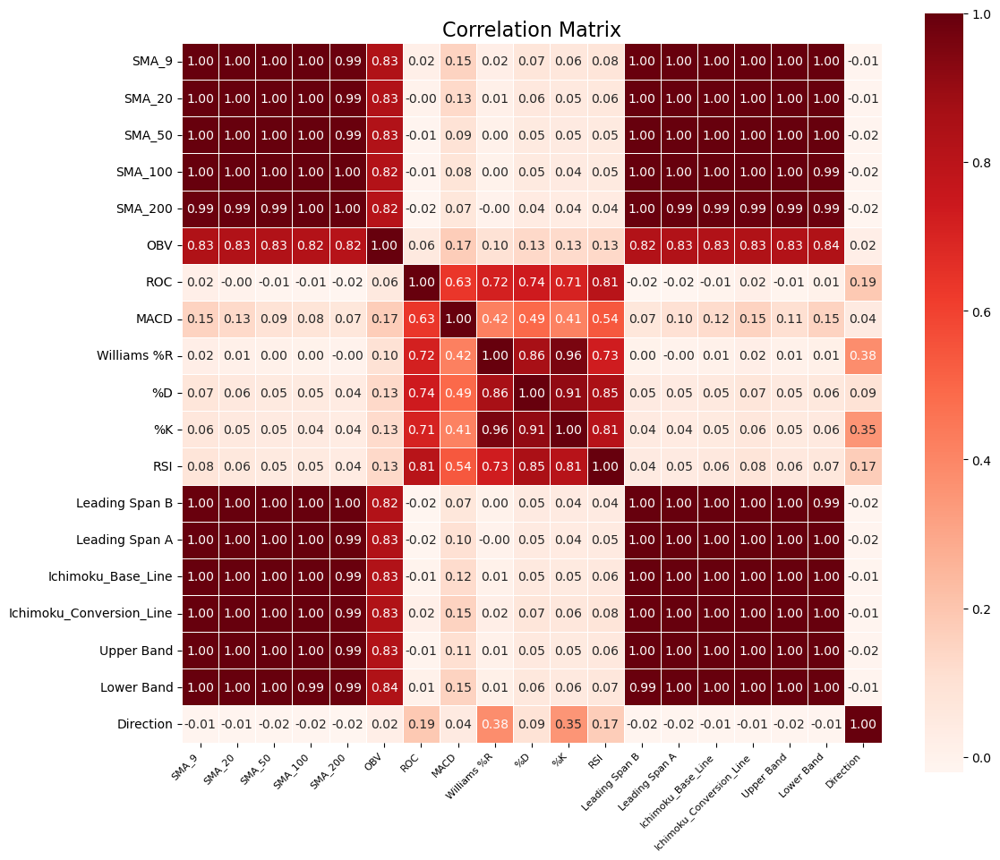

In [16]:
# Select only numeric columns
numeric_columns = Data_corr.select_dtypes(include='number')

# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Create a heatmap with better layout
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='Reds', fmt=".2f", linewidths=.5, square=True)

# Rotate x-axis labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=8)

# Add a title
plt.title('Correlation Matrix', fontsize=16)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [124]:
# Grab our X and Y Columns. We will not pick all the parameters that are highly correlated
X = price_data[['RSI','%K','%D','Williams %R','MACD','OBV','Ichimoku_Conversion_Line']]
Y = price_data['Direction']


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [18]:
# Standardization (Z-score normalization)
scaler_standard = StandardScaler()
X_train_st = scaler_standard.fit_transform(X_train)
X_test_st = scaler_standard.transform(X_test)

In [19]:
# Create a logistic regression classifier
logistic_classifier = LogisticRegression()

# Fit the model to the training data
logistic_classifier.fit(X_train_st, y_train)

# Make predictions on the testing data
y_log = logistic_classifier.predict(X_test_st)

# Get predicted probabilities for the positive class (class 1)
logreg_probabilities = logistic_classifier.predict_proba(X_test_st)

# Calculate and print the accuracy score
print('Correct Prediction (%): ', accuracy_score(y_test, logistic_classifier.predict(X_test_st), normalize = True) * 100.0)

Correct Prediction (%):  83.84970336189849


Training Set:
Accuracy: 0.8448986319432998
              precision    recall  f1-score      support
Down Day       0.848793  0.806521  0.827117  2791.000000
Up Day         0.841874  0.877595  0.859363  3276.000000
accuracy       0.844899  0.844899  0.844899     0.844899
macro avg      0.845334  0.842058  0.843240  6067.000000
weighted avg   0.845057  0.844899  0.844529  6067.000000

Testing Set:
Accuracy: 0.8384970336189849
              precision    recall  f1-score      support
Down Day       0.831307  0.803231  0.817028   681.000000
Up Day         0.844005  0.867225  0.855457   836.000000
accuracy       0.838497  0.838497  0.838497     0.838497
macro avg      0.837656  0.835228  0.836242  1517.000000
weighted avg   0.838305  0.838497  0.838206  1517.000000


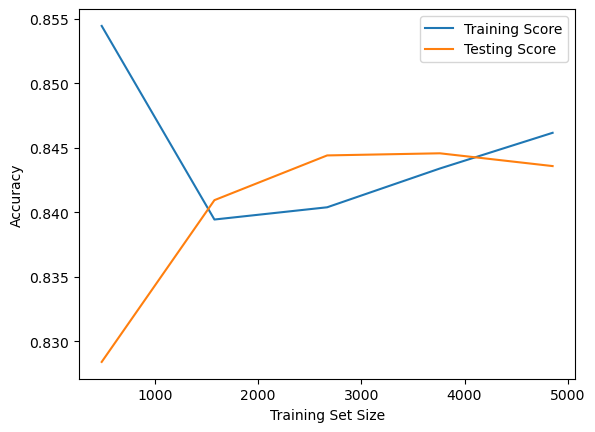

In [52]:
from sklearn.model_selection import learning_curve

# Make predictions on training and testing data
y_train_pred = logistic_classifier.predict(X_train_st)
y_test_pred = logistic_classifier.predict(X_test_st)

# Define the traget names
target_names_reg = ['Down Day', 'Up Day']

# Evaluate performance on training data
print("Training Set:")
print("Accuracy:", accuracy_score(y_train, y_train_pred))
report_train = classification_report(y_true = y_train, y_pred = y_train_pred, target_names = target_names_reg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df_train = pd.DataFrame(report_train).transpose()
print(report_df_train)

# Evaluate performance on testing data
print("\nTesting Set:")
print("Accuracy:", accuracy_score(y_test, y_test_pred))
report_test = classification_report(y_true = y_test, y_pred = y_test_pred, target_names = target_names_reg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df_test = pd.DataFrame(report_test).transpose()
print(report_df_test)

# Plot learning curves
train_sizes, train_scores, test_scores = learning_curve(logistic_classifier, X_train_st, y_train, cv=5)
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Testing Score')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [87]:
from sklearn.model_selection import cross_val_score
cv_precision = cross_val_score(logistic_classifier, X_train_st, y_train, cv=5, scoring='precision')
print("Cross-Validation Precision Scores:", cv_precision)
print("Mean CV Precision:", np.mean(cv_precision))

Cross-Validation Precision Scores: [0.83357041 0.8374817  0.82844575 0.84911243 0.85125184]
Mean CV Precision: 0.8399724251371783


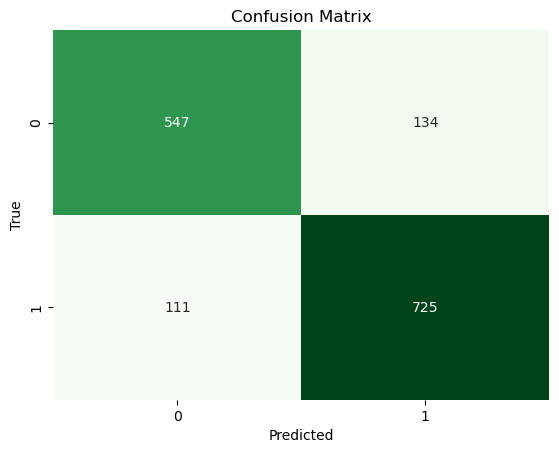

In [20]:
matrix = confusion_matrix(y_test, y_log)

true_negatives = matrix[0][0]
false_negatives = matrix[1][0]
true_positives = matrix[1][1]
false_positives = matrix[0][1]

# Plot the confusion matrix
sns.heatmap(matrix, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [21]:
# Define the traget names
target_names_reg = ['Down Day', 'Up Day']


report_reg = classification_report(y_true = y_test, y_pred = y_log, target_names = target_names_reg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df = pd.DataFrame(report_reg).transpose()
report_df

,precision,recall,f1-score,support
Down Day,0.831307,0.803231,0.817028,681.000000
Up Day,0.844005,0.867225,0.855457,836.000000
accuracy,0.838497,0.838497,0.838497,0.838497
macro avg,0.837656,0.835228,0.836242,1517.000000
weighted avg,0.838305,0.838497,0.838206,1517.000000


In [125]:
# Calculate feature importance and store in pandas series
feature_imp_logreg = pd.Series(logistic_classifier.coef_[0], index=X.columns).sort_values(ascending=False)

# Display feature importance
print("Feature Importance (Logistic Regression):")
print(feature_imp_logreg)



Feature Importance (Logistic Regression):
Williams %R                 3.637902
%K                          3.601613
RSI                         0.679596
OBV                         0.148952
MACD                        0.083632
Ichimoku_Conversion_Line   -0.194835
%D                         -6.904379
dtype: float64


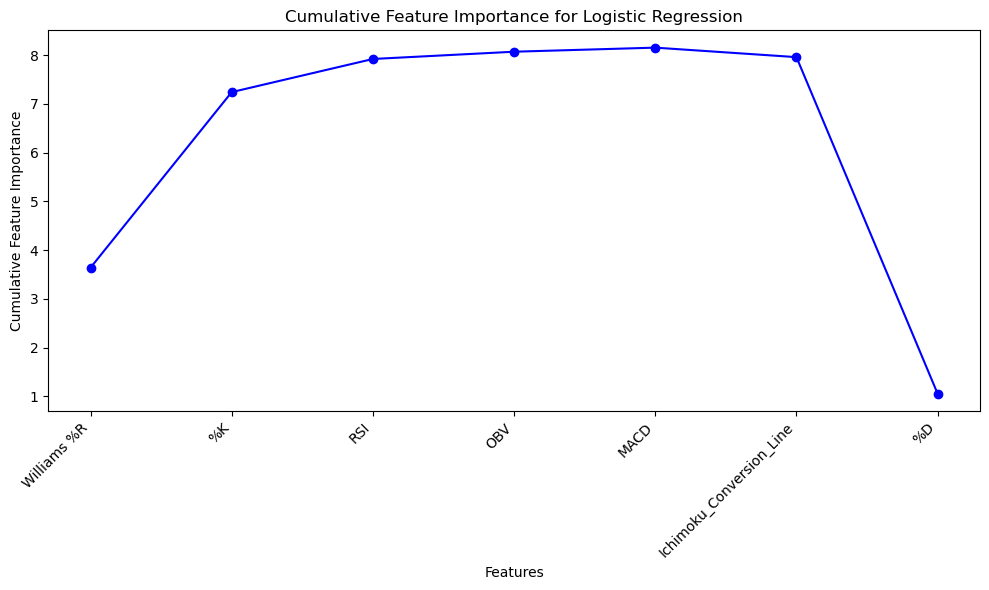

In [126]:
# Calculate cumulative feature importance
cumulative_imp = feature_imp_logreg.cumsum()

# Plotting a line chart for cumulative feature importance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_imp.index, cumulative_imp.values, marker='o', linestyle='-', color='b')
plt.xlabel('Features')
plt.ylabel('Cumulative Feature Importance')
plt.title("Cumulative Feature Importance for Logistic Regression")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()



Now we will generate the Random Forest CLassifier

In [89]:
# Create a Random Forest Classifier
rand_frst_clf = RandomForestClassifier(min_samples_split=50,min_samples_leaf=50, random_state = 42)

# Fit the data to the model
rand_frst_clf.fit(X_train, y_train)

# Make predictions
y_pred = rand_frst_clf.predict(X_test)

# Get predicted probabilities for the positive class (class 1)
rf_probabilities = rand_frst_clf.predict_proba(X_test)

# Print the Accuracy of our Model.
print('Correct Prediction (%): ', accuracy_score(y_test, rand_frst_clf.predict(X_test), normalize = True) * 100.0)

Correct Prediction (%):  83.38826631509558


Training Set:
Accuracy: 0.8472061974616779
              precision    recall  f1-score      support
Down Day       0.853030  0.806879  0.829313  2791.000000
Up Day         0.842720  0.881563  0.861704  3276.000000
accuracy       0.847206  0.847206  0.847206     0.847206
macro avg      0.847875  0.844221  0.845508  6067.000000
weighted avg   0.847463  0.847206  0.846803  6067.000000

Testing Set:
Accuracy: 0.8338826631509558
              precision    recall  f1-score      support
Down Day       0.830508  0.791483  0.810526   681.000000
Up Day         0.836406  0.868421  0.852113   836.000000
accuracy       0.833883  0.833883  0.833883     0.833883
macro avg      0.833457  0.829952  0.831319  1517.000000
weighted avg   0.833758  0.833883  0.833444  1517.000000


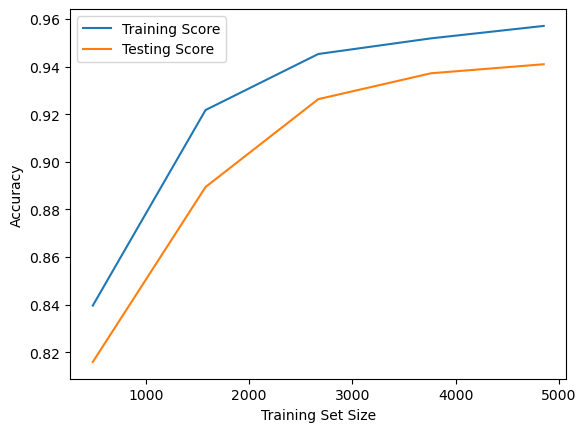

In [90]:
# Make predictions on training and testing data
y_train_s = rand_frst_clf.predict(X_train)
y_test_s = rand_frst_clf.predict(X_test)

# Define the traget names
target_names_reg = ['Down Day', 'Up Day']

# Evaluate performance on training data
print("Training Set:")
print("Accuracy:", accuracy_score(y_train, y_train_s))
report_train = classification_report(y_true = y_train, y_pred = y_train_s, target_names = target_names_reg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df_train1 = pd.DataFrame(report_train).transpose()
print(report_df_train1)

# Evaluate performance on testing data
print("\nTesting Set:")
print("Accuracy:", accuracy_score(y_test, y_test_s))
report_test = classification_report(y_true = y_test, y_pred = y_test_s, target_names = target_names_reg, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df_test1 = pd.DataFrame(report_test).transpose()
print(report_df_test1)

# Plot learning curves
train_sizes, train_scores, test_scores = learning_curve(rand_frst_clf, X_train, y_train_s, cv=5)
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Testing Score')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [91]:
cv_precision = cross_val_score(rand_frst_clf, X_train, y_train, cv=5, scoring='precision')
print("Cross-Validation Precision Scores:", cv_precision)
print("Mean CV Precision:", np.mean(cv_precision))

Cross-Validation Precision Scores: [0.80403458 0.81792319 0.83606557 0.81140351 0.83861237]
Mean CV Precision: 0.8216078438086717


In [92]:
# Define the traget names
target_names = ['Down Day', 'Up Day']

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred, target_names = target_names, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df1 = pd.DataFrame(report).transpose()
report_df1

,precision,recall,f1-score,support
Down Day,0.830508,0.791483,0.810526,681.000000
Up Day,0.836406,0.868421,0.852113,836.000000
accuracy,0.833883,0.833883,0.833883,0.833883
macro avg,0.833457,0.829952,0.831319,1517.000000
weighted avg,0.833758,0.833883,0.833444,1517.000000


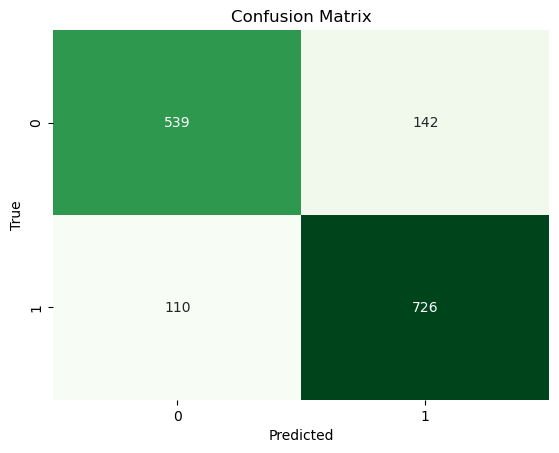

In [93]:
matrix = confusion_matrix(y_test, y_pred)

true_negatives = matrix[0][0]
false_negatives = matrix[1][0]
true_positives = matrix[1][1]
false_positives = matrix[0][1]

# Plot the confusion matrix
sns.heatmap(matrix, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [94]:
# Calculate feature importance and store in pandas series
feature_imp = pd.Series(rand_frst_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
feature_imp

%K                          0.318506
Williams %R                 0.314014
%D                          0.262500
RSI                         0.049941
MACD                        0.032034
Ichimoku_Conversion_Line    0.013614
OBV                         0.009392
dtype: float64

Text(0.5, 1.0, 'Random Forest: Feature Importance Graph')

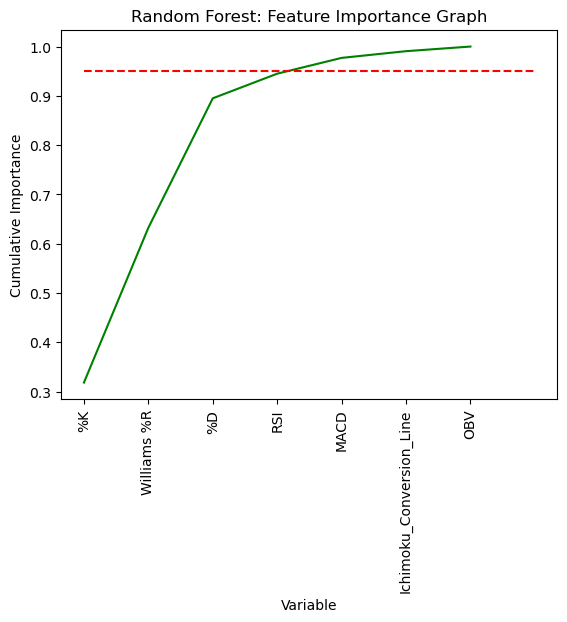

In [95]:
# store the values in a list to plot.
x_values = list(range(len(rand_frst_clf.feature_importances_)))

# Cumulative importances
cumulative_importances = np.cumsum(feature_imp.values)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin = 0, xmax = len(feature_imp), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, feature_imp.index, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable')
plt.ylabel('Cumulative Importance')
plt.title('Random Forest: Feature Importance Graph')

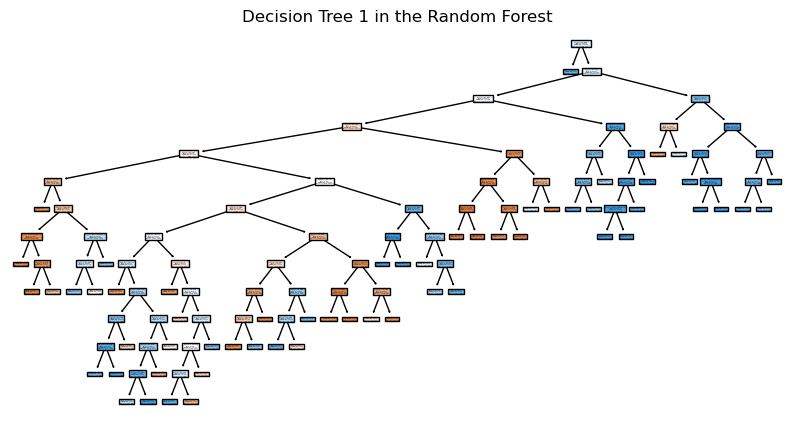

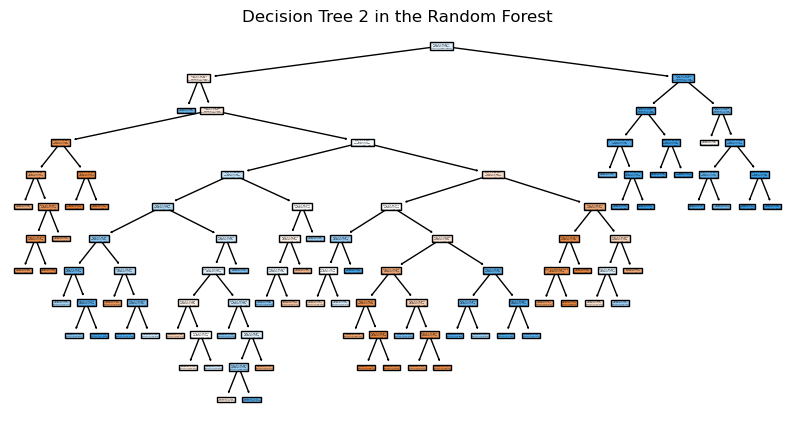

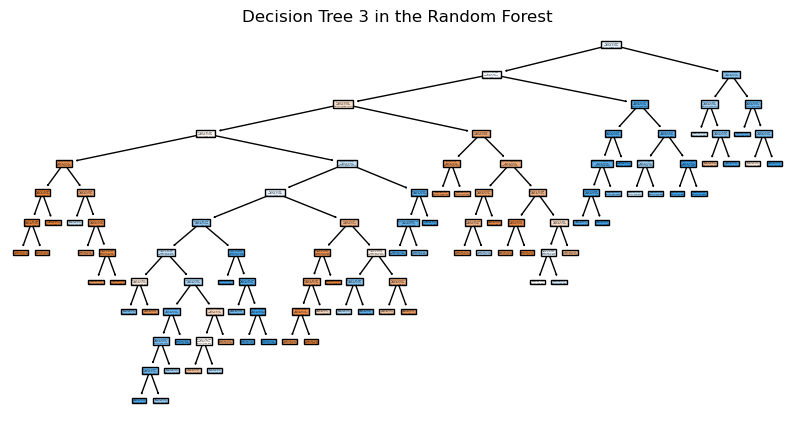

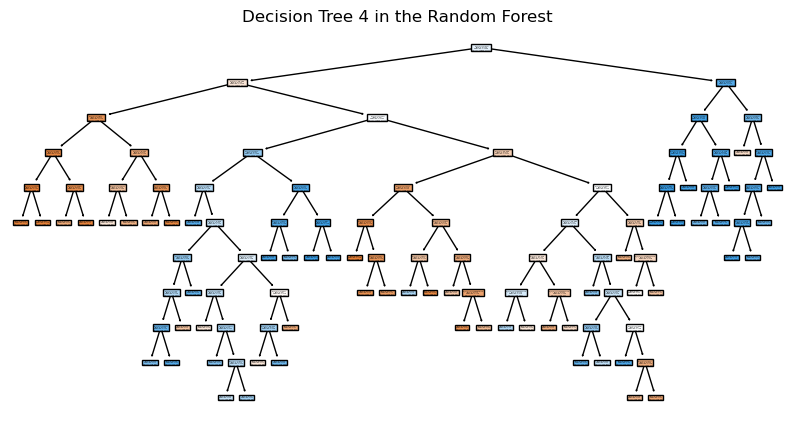

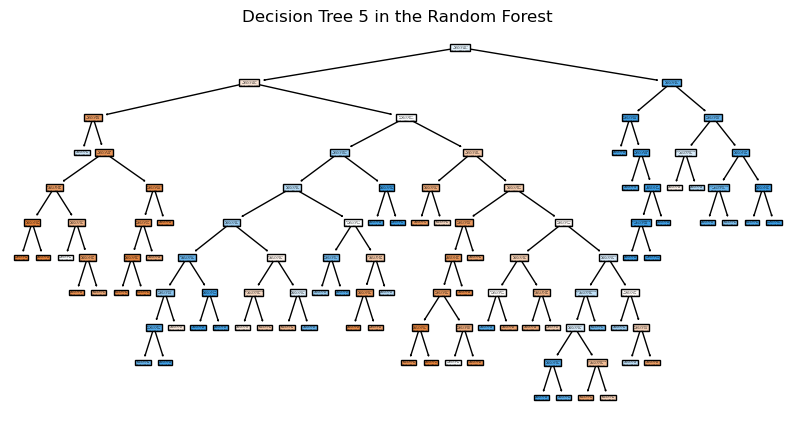

...

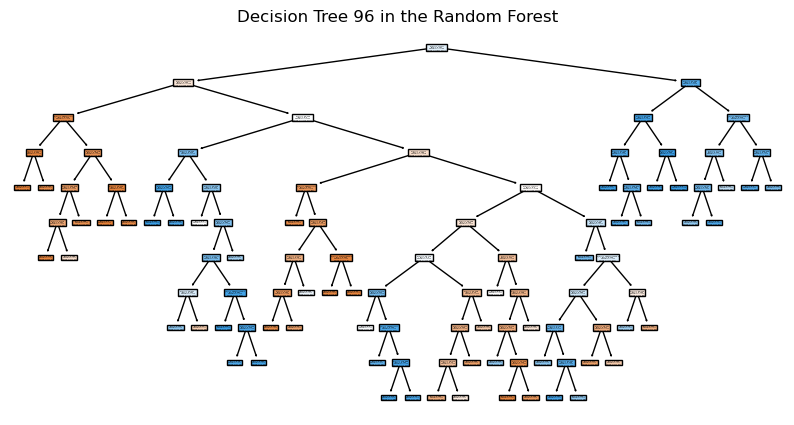

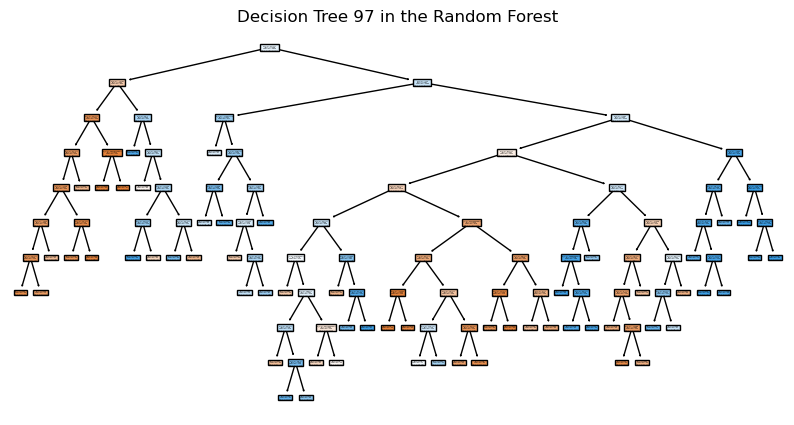

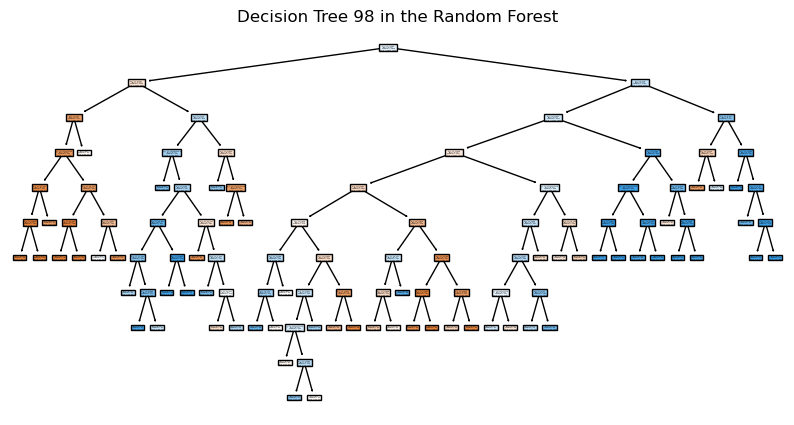

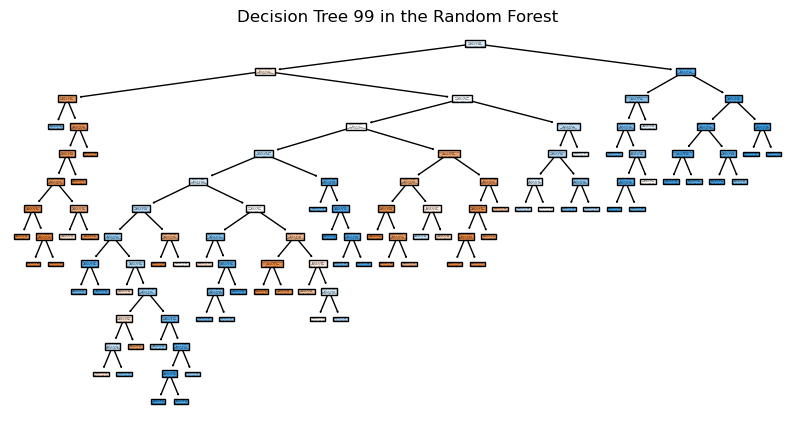

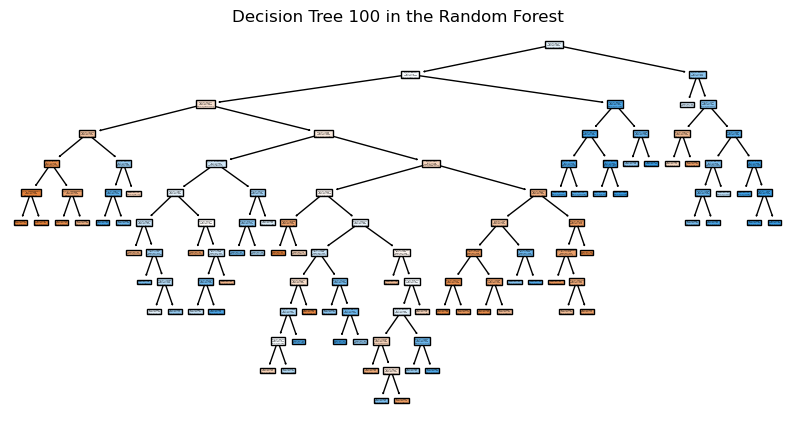

In [118]:

from sklearn import tree
from sklearn.datasets import load_iris

# Load the iris dataset as an example
iris = load_iris()
X, Y = iris.data, iris.target

# Visualize each decision tree in the Random Forest
for i, tree_in_forest in enumerate(rand_frst_clf.estimators_):
    plt.figure(figsize=(10, 5))
    tree.plot_tree(tree_in_forest, filled=True)
    plt.title(f"Decision Tree {i+1} in the Random Forest")
    plt.show()

In [96]:
# Number of trees in random forest
# Number of trees is not a parameter that should be tuned, but just set large enough usually. There is no risk of overfitting in random forest with growing number of # trees, as they are trained independently from each other. 
n_estimators = list(range(200, 2000, 200))

# Number of features to consider at every split
max_features = ['auto', 'sqrt', None, 'log2']

# Maximum number of levels in tree
# Max depth is a parameter that most of the times should be set as high as possible, but possibly better performance can be achieved by setting it lower.
max_depth = list(range(10, 110, 10))
max_depth.append(None)

# Minimum number of samples required to split a node
# Higher values prevent a model from learning relations which might be highly specific to the particular sample selected for a tree. Too high values can also lead to # under-fitting hence depending on the level of underfitting or overfitting, you can tune the values for min_samples_split.
min_samples_split = [2, 5, 10, 20, 30, 40]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 7, 12, 14, 16 ,20]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    'n_estimators': [int(x) for x in np.linspace(start=200, stop=2000, num=10)],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [int(x) for x in np.linspace(10, 110, num=11)],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['sqrt', 'log2'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [103]:
# New Random Forest Classifier to house optimal parameters
rf = RandomForestClassifier()

# Specfiy the details of our Randomized Search
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [105]:
# With the new Random Classifier trained we can proceed to our regular steps, prediction.
rf_random.predict(X_test)


# Once the predictions have been made, then grab the accuracy score.
print('Correct Prediction (%): ', accuracy_score(y_test, rf_random.predict(X_test), normalize = True) * 100.0)

Correct Prediction (%):  83.58602504943968


In [106]:
#  CLASSIFICATION REPORT
# Define the traget names
target_names = ['Down Day', 'Up Day']

# Build a classifcation report
report = classification_report(y_true = y_test, y_pred = y_pred, target_names = target_names, output_dict = True)

# Add it to a data frame, transpose it for readability.
report_df2 = pd.DataFrame(report).transpose()
display(report_df2)
print('\n')

,precision,recall,f1-score,support
Down Day,0.830508,0.791483,0.810526,681.000000
Up Day,0.836406,0.868421,0.852113,836.000000
accuracy,0.833883,0.833883,0.833883,0.833883
macro avg,0.833457,0.829952,0.831319,1517.000000
weighted avg,0.833758,0.833883,0.833444,1517.000000


In [99]:
# Calculate feature importance and store in pandas series
feature_imp = pd.Series(rand_frst_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
display(feature_imp)

%K                          0.318506
Williams %R                 0.314014
%D                          0.262500
RSI                         0.049941
MACD                        0.032034
Ichimoku_Conversion_Line    0.013614
OBV                         0.009392
dtype: float64

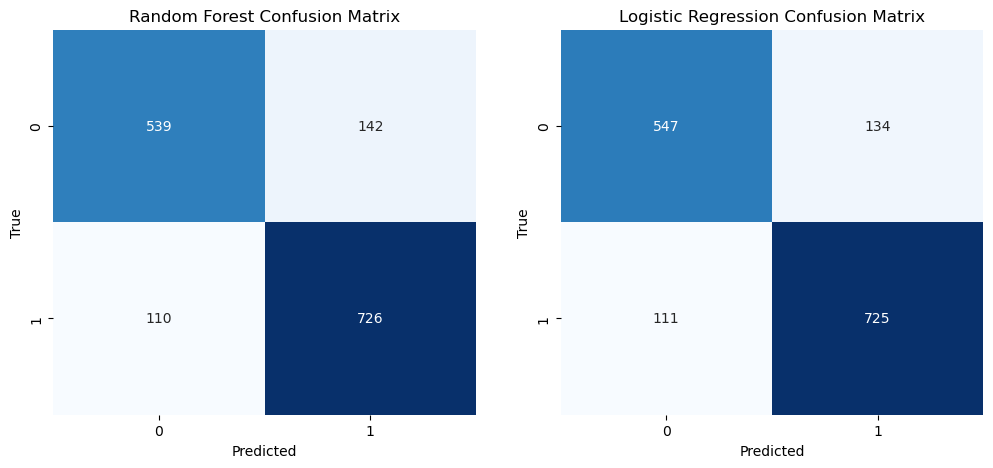

In [112]:
rf_conf_matrix = confusion_matrix(y_test, y_pred)
logreg_conf_matrix = confusion_matrix(y_test, y_log)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.heatmap(rf_conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Random Forest Confusion Matrix')

plt.subplot(1, 2, 2)
sns.heatmap(logreg_conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Logistic Regression Confusion Matrix')

plt.show()

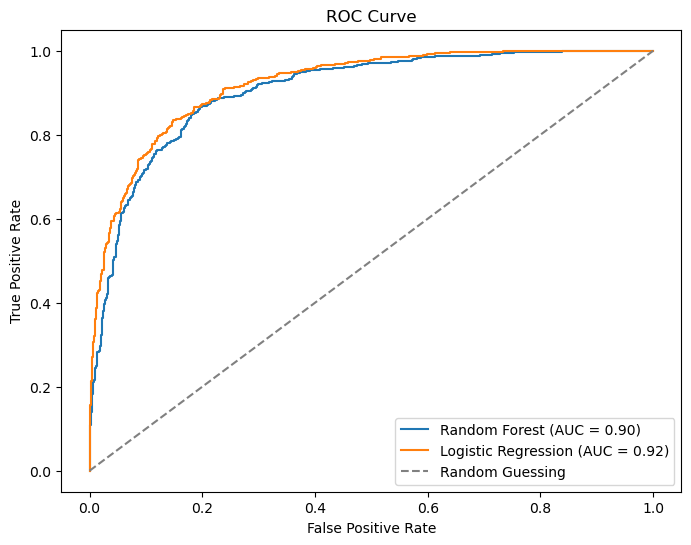

In [108]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probabilities[:, 1])
logreg_fpr, logreg_tpr, _ = roc_curve(y_test, logreg_probabilities[:, 1])

plt.figure(figsize=(8, 6))
plt.plot(rf_fpr, rf_tpr, label='Random Forest (AUC = {:.2f})'.format(auc(rf_fpr, rf_tpr)))
plt.plot(logreg_fpr, logreg_tpr, label='Logistic Regression (AUC = {:.2f})'.format(auc(logreg_fpr, logreg_tpr)))

plt.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random Guessing')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()

plt.show()

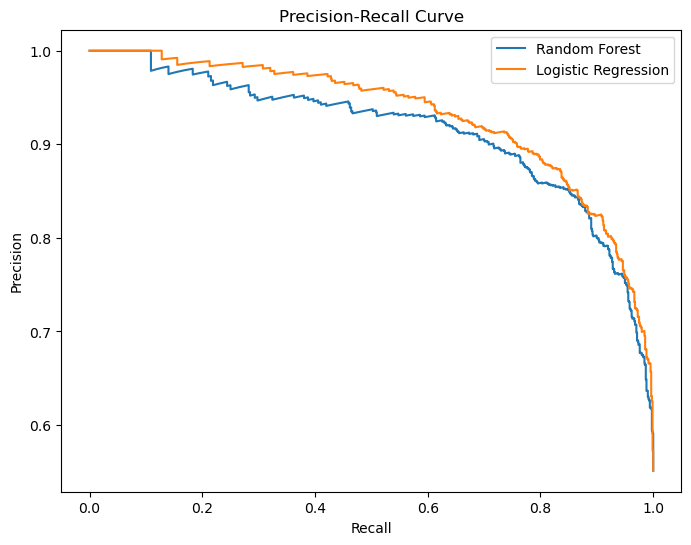

In [107]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probabilities[:, 1])
logreg_precision, logreg_recall, _ = precision_recall_curve(y_test, logreg_probabilities[:, 1])

plt.figure(figsize=(8, 6))
plt.plot(rf_recall, rf_precision, label='Random Forest')
plt.plot(logreg_recall, logreg_precision, label='Logistic Regression')

plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()

plt.show()